**СОДЕРЖАНИЕ С ГИПЕРССЫЛКАМИ:**
1. [Вступление, цели, задачи](#intro)
2. [Загрузка библиотек](#download)
3. [Открытие и описание данных](#open)
4. [Предобработка данных](#preprocessing)
    *  [Обработка пропущенных значений](#null)
    *  [Обработка дубликатов](#dubli)
    *  [Проверка данных на ошибки](#mistake)
    *  [Обогащение таблицы](#enrichment)
    *  [Обнаружение и фильтрация выбросов](#outliers)
        *  [Вывод](#conclusion1)
5. [Анализ данных](#analys)
    *  [Анализ категорий мест общественного питания](#catering)
    *  [Количество посадочных мест в заведении в зависимости от категории](#seats)
    *  [Соотношение сетевых и несетевых заведений](#chain)
    *  [Какие заведения чаще всего бывают сетевыми](#chain2)
    *  [Топ-15 популярных сетей общественного питания в г. Москва](#top-15)
    *  [Распределение заведений общественного питания по районам г. Москва](#district)
    *  [Распределение средних рейтингов по категориям заведений](#rating)
    *  [Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района Москвы](#horoplet)
    *  [Все заведения датасета, карта с кластерами](#map)
    *  [Топ-15 улиц по количеству заведений](#adress-15)
    *  [Улицы с одним объектом общепита](#one_only)
    *  [Медианная стоимость заказов в разлиных заведениях в рублях](#median)
  
        *   [Общий вывод](#o)
5. [Детализируем исследование: открытие кофейни](#detail)
    *  [Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?](#cofe)
    *  [Круглосуточные кофейни](#open_cofe)
    *  [Рейтинг кофеен в зависимости от административного центра](#rating_cofe)
    *  [На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?](#cofe_price)
* [Презентация в облачном хранилище:](#presentation)
  

## Вступление, цели, задачи:
<a id='intro'></a>

**Кратко опишем то, что имеем:**
______
Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

* **ЦЕЛЬ:** подготовить исследование рынка Москвы.
* **ЗАДАЧИ:** найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
____
*Информация о датасете: датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.*
____
1) `name` - название заведения;

2) `category` - категория заведения, например «кафе», «пиццерия» или «кофейня»;

3) `address` - адрес заведения;

4) `district` - административный район, в котором находится заведение, например Центральный административный округ;

5) `hours` - информация о днях и часах работы;

6) `lat` - *широта* географической точки, в которой находится заведение;

7) `lng` - *долгота* географической точки, в которой находится заведение;

8) `rating` - рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

9) `price` - категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

10) `avg_bill` - строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
 «Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;

11) `middle_coffee_cup` - число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

12) `chain` - число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым

13) `seats` - количество посадочных мест

14) `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

## Загрузка библиотек
<a id="download"></a> 


In [1]:
#Загрузим нужные нам библиотеки отдельным окном
import pandas as pd
import io 
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np
from plotly import graph_objects as go 
import json

# импортируем карту и хороплет
from folium import Map, Choropleth

import warnings #у меня здесь вылетают варнинги, так что удалим их
warnings.filterwarnings("ignore")

## Открытие и описание данных
<a id="open"></a>

In [2]:
#откроем датафрейм и посмотрим общую информацию о нём
df = pd.read_csv('/datasets/moscow_places.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


## Предобработка данных
<a id='preprocessing'></a>

### Обработка пропущенных значений
<a id='null'></a>

Посмотрим на отсутствующие значения:

Строк, которые бы состояли полностью из отсутствующих значений не имеем:

In [3]:
df.dropna(how="all")
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


Видим, что количество строк осталось прежним. 

In [4]:
#выведем процент пропусков по столбцу
pd.concat([df.isna().sum(), df.isna().mean().apply(lambda x: '{0:.1f}%'.format(x * 100))], 
          axis=1).rename(columns={0:'количество пропусков', 1:'доля пропусков'})

,количество пропусков,доля пропусков
name,0,0.0%
category,0,0.0%
address,0,0.0%
district,0,0.0%
hours,536,6.4%
lat,0,0.0%
lng,0,0.0%
rating,0,0.0%
price,5091,60.6%
avg_bill,4590,54.6%


* Восполнять пропущенные значения, например, медианой или средним, в данном случае, мне кажется невозможным. Например, может показаться, что можно было бы попробовать восполнить количество посадочных мест рассортировав заведения в зависимости от категории (ресторан, кафе), но при изучении таблицы можно увидеть, что при одной категории, например, кафе - количество посадочных мест может отличаться в 2 раза в одном и том же районе. Рейтинг - является субъективным показателем, который получается в результате голосования посетителей кафе, его так же нельзя заменить на среднее или медиану. Заменять NaN на 0 не целлесообразно, по той причине, что в дальнейшем это может исказить графики, которые мы будем строить. Огромное количество пропусков мы наблюдаем в столбцах, отражающих средний чек, среднюю стоимость чашки кофе, категорию кафе по стоимости "выше среднего, среднее". 
* Заменим в столбцах `hours` и `price` пропуски на слово "неизвестно" сохраняя русско-язычный стиль написания.
* Посмотрим какие значения содержит столбец `district`

In [6]:
df['hours'] = df['hours'].fillna('неизвестно')
df['price'] = df['price'].fillna('неизвестно')
print(len(df), "количество строк в датафрейме")
print(' ')
print(df.nunique())
#посмотрим, сколько неуникальных значений имеется, для общего понимания полученных данных

8406 количество строк в датафрейме
 
name                 5614
category                8
address              5753
district                9
hours                1308
lat                  8209
lng                  8258
rating                 41
price                   5
avg_bill              897
middle_avg_bill       230
middle_coffee_cup      96
chain                   2
seats                 229
dtype: int64


Ничего сверх-естественного пока не вижу, количество административных округов так же в норме (проверила отдельно, не стала вносить в отчет). 

### Обработка дубликатов
<a id='dubli'></a>

Для обработки дубликатов приведём к нижнему регистру Series содержащие данные типа object? чтобы наверняка не пропустить какие-либо дубликаты из-за особенностей написания названий заведения или их адреса или района. Так же, заменим точки и тире на пробелы, а так же уберём лишние пробелы (но только в столбце `name`). Подобные опечатки встречаются повсеместно, хотя чисто визуально, на данном этапе, я не вижу их в данных. 

In [7]:
#приведём данные к нижнему регистру
df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()


In [8]:
#заменим точку, тире, два пробела - на один пробел
df['name'] = df['name'].replace('.', ' ')
df['name'] = df['name'].replace('-', ' ')
df['name'] = df['name'].replace('  ', ' ')

In [9]:
#ищем полные дубликаты
df[df.duplicated()] 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


То есть полностью задублированных строк не имеем

Поищем дубликаты в строках по трём основным колонкам: название заведения, его адрес и район расположения. Так как заведение может быть сетевым, его название в таблице может повторяться несколько раз. Поэтому, чтобы случайно не удалить лишнего (на самом деле не задублированные сетевые заведения), воспользуемся способом ниже:

In [10]:
df[df.duplicated(['name', 'category', 'address', 'district'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,неизвестно,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,неизвестно,NaN,NaN,NaN,1,188.0


И так, мы нашли строки, которые имеют дубликаты и по названию и по адресу и по категории и по району расположения. Почему категорию мы так же сюда включили: иногда ресторан в одном здании разделяется на два подвида, в одном зале ресторан является рестораном, а рядом - он является баром. Поэтому сказать, что если один и тот же ресторан имеет одно название, адрес, в одном районе - что это полный дубль, нельзя. Возможно там есть и ресторан и отдельно бар. Удалим найденные дубликаты, сохраняя последнюю строку.

In [91]:
df = df.drop_duplicates(subset=['name', 'category', 'address', 'district'], keep="last")

### Проверка данных на ошибки
<a id='mistake'></a>

Проверим некоторые данные, в частности, числовые, что в них нет каких-нибудь странных значений, типа "нет" вместо 0, или чего-то подобного. 

In [12]:
df['price'].unique()

array(['неизвестно', 'выше среднего', 'средние', 'высокие', 'низкие'],
      dtype=object)

In [13]:
df['chain'].unique()

array([0, 1])

In [14]:
df['lat'].unique()

array([55.878494, 55.875801, 55.889146, ..., 55.648859, 55.648849,
       55.598229])

In [15]:
df['lng'].unique()

array([37.47886 , 37.484479, 37.525901, ..., 37.743219, 37.743222,
       37.604702])

In [16]:
df['rating'].unique()

array([5. , 4.5, 4.6, 4.4, 4.7, 4.8, 4.3, 4.9, 4.2, 4.1, 4. , 3.8, 3.9,
       3.7, 3.6, 2.8, 2.7, 3.1, 1.5, 2. , 1.4, 3.3, 3.5, 3.2, 2.9, 3. ,
       3.4, 2.3, 2.2, 2.5, 2.6, 1.7, 1. , 1.1, 2.4, 1.3, 1.2, 2.1, 1.8,
       1.9, 1.6])

In [17]:
df['seats'].unique()

array([      nan, 4.000e+00, 4.500e+01, 1.480e+02, 7.900e+01, 6.500e+01,
       1.020e+02, 1.800e+02, 9.600e+01, 2.500e+01, 4.600e+01, 4.000e+01,
       2.470e+02, 2.100e+01, 8.000e+00, 3.500e+01, 2.400e+02, 8.500e+01,
       1.200e+01, 6.000e+01, 1.200e+02, 1.600e+01, 8.000e+01, 5.000e+01,
       4.400e+01, 4.300e+01, 9.000e+01, 0.000e+00, 1.980e+02, 9.500e+01,
       3.500e+02, 1.240e+02, 1.000e+01, 7.000e+01, 4.800e+01, 6.000e+00,
       9.800e+01, 3.000e+01, 5.200e+01, 2.000e+01, 2.000e+00, 1.800e+01,
       2.200e+01, 1.500e+01, 2.800e+01, 3.000e+02, 7.500e+01, 3.200e+01,
       1.000e+02, 1.100e+02, 2.300e+02, 2.500e+02, 1.300e+02, 8.400e+01,
       3.980e+02, 2.700e+01, 2.860e+02, 1.450e+02, 3.600e+01, 9.700e+01,
       2.260e+02, 1.400e+02, 1.660e+02, 2.020e+02, 9.400e+01, 1.890e+02,
       5.300e+01, 1.040e+02, 7.200e+01, 1.310e+02, 1.050e+02, 5.500e+01,
       1.700e+01, 1.000e+00, 1.150e+02, 3.100e+02, 7.700e+01, 1.600e+02,
       3.200e+02, 3.400e+01, 1.500e+02, 2.000e+02, 

В принципе, ничего критичного, что требовало бы использования `fillna` мы не обнаружили.

In [18]:
df['category'].value_counts() #посмотрим, нет ли в категории чего-то странного или ошибок в написании

кафе               2377
ресторан           2042
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

Как видим, ошибок в написании среди категорий общепита нет. В Москве мало булочных и очень много просто "кафе", со столовыми тоже не очень. 

### Обогащение таблицы
<a id='enrichment'></a>

Создадим дополнительные столбцы для дальшейго удобного анализа данных. 

Добавим столбец с названием улицы, на котором располагается общепит:

In [19]:
#используем функцию лямбда, она режет строку оставляя то, что между запятых (название улицы, г.Зеленоград в том числе)
df['street'] = df['address'].apply(lambda x: x.split(', ')[1])
df.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,неизвестно,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица


In [20]:
#Код ревьюера
df.query('street == "проспект мира"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
718,все лень,ресторан,"москва, проспект мира, 119, стр. 528",Северо-Восточный административный округ,"пн-чт 12:00–21:00; пт,сб 12:00–22:00; вс 12:00...",55.836107,37.614875,4.4,выше среднего,Средний счёт:от 1500 ₽,1500.0,NaN,0,NaN,проспект мира
786,старое место,кафе,"москва, проспект мира, 119, стр. 504",Северо-Восточный административный округ,"ежедневно, 11:00–22:00",55.837212,37.616469,4.1,средние,Средний счёт:900–1100 ₽,1000.0,NaN,0,NaN,проспект мира
792,doner one,кафе,"москва, проспект мира, 119, стр. 596",Северо-Восточный административный округ,"ежедневно, 11:00–21:00",55.839037,37.613027,4.2,неизвестно,NaN,NaN,NaN,0,NaN,проспект мира
800,пян-се,быстрое питание,"москва, проспект мира, 119, стр. 27",Северо-Восточный административный округ,"ежедневно, 10:00–20:00",55.834563,37.613549,4.4,неизвестно,NaN,NaN,NaN,1,NaN,проспект мира
909,космос,кафе,"москва, проспект мира, 119, стр. 34",Северо-Восточный административный округ,вт-вс 10:45–21:00,55.835060,37.622033,3.8,неизвестно,NaN,NaN,NaN,0,NaN,проспект мира
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2568,ice embassy,кафе,"москва, проспект мира, 26, стр. 2",Центральный административный округ,"ежедневно, круглосуточно",55.777311,37.636400,4.4,неизвестно,NaN,NaN,NaN,0,273.0,проспект мира
2571,"халва, сеть почтоматов",кафе,"москва, проспект мира, 146",Северо-Восточный административный округ,пн-пт 10:00–19:00,55.820575,37.641970,3.6,неизвестно,NaN,NaN,NaN,0,18.0,проспект мира
2572,ресторан,ресторан,"москва, проспект мира, 62, стр. 1",Центральный административный округ,неизвестно,55.785618,37.635511,4.3,неизвестно,NaN,NaN,NaN,0,200.0,проспект мира
4782,food embassy,ресторан,"москва, проспект мира, 26, стр. 2",Центральный административный округ,"ежедневно, 10:00–00:00",55.777224,37.636288,4.5,высокие,Средний счёт:2500–3000 ₽,2750.0,NaN,0,273.0,проспект мира


Нас просят обогатить таблицу столбцом, в котором в форме булевой алгебры будет отмечено, работает ли заведение круглосуточно (`True`) или нет (`False`). Нужно изучить данный столбец и понять, в каком вообще виде могут обозначать часы работы заведений. 

In [21]:
df['hours'].unique() #мало данных

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [22]:
df['hours'].sort_values().count() #слишком много данных

8404

Нужно отметить, что, конечно, 7868 уникальных строк это многовато и, конечно, их так не изучишь. 

In [23]:
display(df['hours']) #ага, увидели, что есть обозначение "круглосуточно, ежедневно"

0                                  ежедневно, 10:00–22:00
1                                  ежедневно, 10:00–22:00
2       пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...
3                                  ежедневно, 09:00–22:00
4                                  ежедневно, 10:00–22:00
                              ...                        
8401                               ежедневно, 09:00–02:00
8402                               ежедневно, 08:00–22:00
8403                             ежедневно, круглосуточно
8404                             ежедневно, круглосуточно
8405                             ежедневно, круглосуточно
Name: hours, Length: 8404, dtype: object

In [24]:
df['hours'].sample(n=20) #выведу случайные 20 строк из фрейма данных, посмотреть, какие ещё варианты есть

844                                ежедневно, 08:00–23:00
7634                               ежедневно, 09:00–20:00
5597                               ежедневно, 10:00–22:00
8318                             ежедневно, круглосуточно
3613                               ежедневно, 10:00–00:00
6917                               ежедневно, 11:00–03:00
1449                               ежедневно, 11:00–23:00
1151                               ежедневно, 10:00–22:00
5151    пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 10:00...
6048                               ежедневно, 10:00–22:00
339     пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...
2072                                           неизвестно
6685                               ежедневно, 09:00–23:00
7511                             ежедневно, круглосуточно
42                                 ежедневно, 09:00–23:00
6516                               ежедневно, 09:00–21:00
4967                               ежедневно, 10:00–00:00
6585          

Мы выяснили, что нас итересуют строки с вполне конкретными данными в Series `hours`: это **ежедневно, круглосточно**

In [25]:
df['is_24/7'] = np.where(df.hours == 'ежедневно, круглосуточно', 'TRUE', 'FALSE') #делаем столбец

In [26]:
df.sample(n=20) #проверяем, работает ли

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
4975,brasserie lambic,"бар,паб","москва, улица большая ордынка, 65",Центральный административный округ,"пн-чт 12:00–00:00; пт 12:00–02:00; сб,вс 12:00...",55.731505,37.624360,4.7,средние,Средний счёт:1000 ₽,1000.0,NaN,1,NaN,улица большая ордынка,FALSE
416,чайхана халал,ресторан,"москва, смольная улица, 24г, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.860894,37.482553,4.3,неизвестно,NaN,NaN,NaN,0,53.0,смольная улица,TRUE
7550,рояль,кафе,"москва, мкад, 14-й километр, 4",Юго-Восточный административный округ,"ежедневно, 06:00–18:00",55.652335,37.831015,2.6,неизвестно,NaN,NaN,NaN,0,NaN,мкад,FALSE
2171,хинкали-gали!,кафе,"москва, ярославская улица, 10, корп. 2",Северо-Восточный административный округ,"ежедневно, 09:00–23:00",55.820487,37.647843,4.4,неизвестно,NaN,NaN,NaN,1,95.0,ярославская улица,FALSE
2832,sio,столовая,"москва, щёлковское шоссе, 3с1",Восточный административный округ,"ежедневно, 11:00–18:00",55.803958,37.752634,4.1,неизвестно,NaN,NaN,NaN,0,NaN,щёлковское шоссе,FALSE
8120,чистая линия,"бар,паб","москва, большая тульская улица, 13",Южный административный округ,"ежедневно, 10:00–22:00",55.708723,37.622331,4.3,неизвестно,NaN,NaN,NaN,0,83.0,большая тульская улица,FALSE
5949,магазин кулинария,кафе,"москва, университетский проспект, 6, корп. 2",Юго-Западный административный округ,"ежедневно, 09:00–20:00",55.698878,37.553055,4.4,неизвестно,NaN,NaN,NaN,0,NaN,университетский проспект,FALSE
7467,додо пицца,пиццерия,"москва, краснодарская улица, 65/18с2",Юго-Восточный административный округ,"ежедневно, 09:00–23:00",55.675915,37.771935,4.2,неизвестно,Средний счёт:426 ₽,426.0,NaN,1,NaN,краснодарская улица,FALSE
1173,вкусно,ресторан,"москва, улица докукина, 10, стр. 11",Северо-Восточный административный округ,"ежедневно, 10:00–23:00",55.840400,37.655512,4.1,неизвестно,NaN,NaN,NaN,0,NaN,улица докукина,FALSE
4738,кафе чемпион,ресторан,"москва, каланчёвский тупик, 9, стр. 2",Центральный административный округ,"ежедневно, 11:00–23:00",55.770628,37.648977,4.3,неизвестно,NaN,NaN,NaN,0,NaN,каланчёвский тупик,FALSE


Отлично, всё работает, в таблице есть круглосуточное заведение и мы видим что в столбце отображено `TRUE`.

Таблица обогащена. 

### Обнаружение и фильтрация выбросов
<a id='outliers'></a>

В целом, данную процедуру можно провести в последующем анализе данных, но частичный обзор я предпочитаю сделать сейчас, данная методика подходит только для числовых данных.

In [27]:
#проведём простую процедуру описания числовых данных
columns = ['rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats']
df[columns].describe().T

,count,mean,std,min,25%,50%,75%,max
rating,8404.0,4.230021,0.470270,1.0,4.1,4.3,4.4,5.0
middle_avg_bill,3149.0,958.053668,1009.732845,0.0,375.0,750.0,1250.0,35000.0
middle_coffee_cup,535.0,174.721495,88.951103,60.0,124.5,169.0,225.0,1568.0
seats,4794.0,108.405090,122.840831,0.0,40.0,75.0,140.0,1288.0


Во всех столбцах, кроме `rating`, имеются выбросы. 

In [28]:
#добавим к описаню данных медиану
columns = ['rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats']
names = {'rating':'рейтинг', 'middle_avg_bill':'средний чек', 'middle_coffee_cup':'чашка кофе', 'seats':'места'}
#напишем цикл для вывода медианы для всех столбцов:
for column in columns:
    print(names[column], 'Медиана:', df[column].median())

рейтинг Медиана: 4.3
средний чек Медиана: 750.0
чашка кофе Медиана: 169.0
места Медиана: 75.0


Для наглядности построим графики "скрипки", чтобы увидеть сразу и распредедение, и выбросы, и плотность распределения данных. 

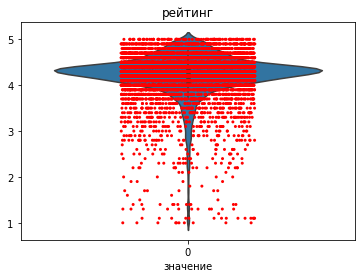

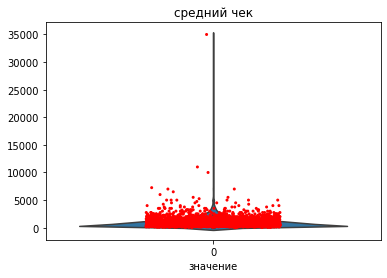

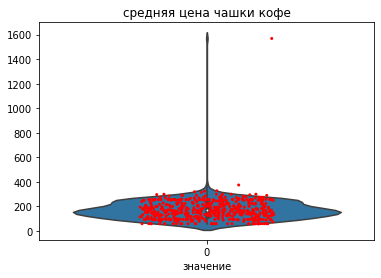

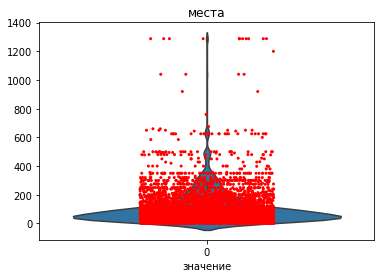

In [29]:
#составляем список столбцов, которые нас интересуют:
columns = ['rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats']
#составим словарь с русско-язычным названием столбцов, чтобы было удобно
names = {'rating':'рейтинг', 'middle_avg_bill':'средний чек',
         'middle_coffee_cup':'средняя цена чашки кофе', 'seats':'места'
        }
#напишем цикл, составляющий графики, чтоб не вводить каждый раз вручную:
for column in columns:
    sns.violinplot(data=df[column]);
    sns.stripplot(data=df[column], color="red", jitter=0.2, size=3);
    plt.title(names[column])
    plt.xlabel('значение')
    plt.show()

**Есть ли выбросы, усекаем ли данные?**
* Да. Выбросы есть. С учётом того, что мы имеем задачу понять, какое заведение общепита стоит открыть и где, выбросы - могут повлиять на результат. 
* Если мы говорим о науке - то иногда, выброс - это не артефакт исследования, иногда - это самая ценная информация и всё исследование строится вокруг него. 
* В нашем же случае, когда исследование строится вокруг тысяч данных - отдельные выбросы, скорее, помеха. Поэтому принимаем решение данные с выбросами надо почистить. 
* Я думаю, что выброс в цене чашке кофе - это просто кто-то забыл поставить запятую, исправим эти данные. Аналогичная ситуация со средним чеком.
* Смущают данные с количеством посадочных мест, но мы видим, что это не единичные выбросы. Вероятней всего, это банкетные залы. Так как заказчик не говорил о том, что не рассматривает вариант открытия банкетного зала, чистить на этом этапе подобные данные мы не станем. 

In [30]:
df = df.replace({'middle_avg_bill':{35000:3500}})

df['middle_avg_bill'].describe()

count     3149.000000
mean       948.050492
std        808.324792
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      11000.000000
Name: middle_avg_bill, dtype: float64

In [31]:
df = df.replace({'middle_coffee_cup':{1568:156.8}})

df['middle_coffee_cup'].describe()

count    535.000000
mean     172.083738
std       65.350414
min       60.000000
25%      124.500000
50%      167.000000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

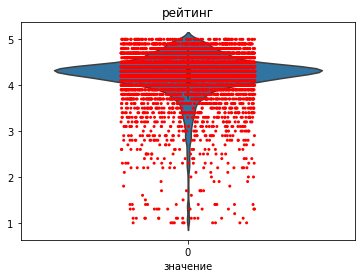

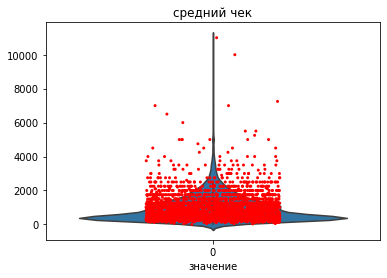

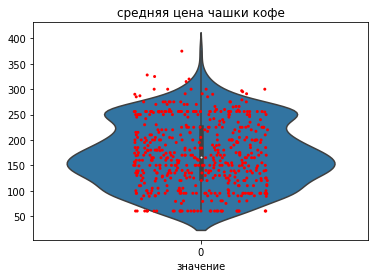

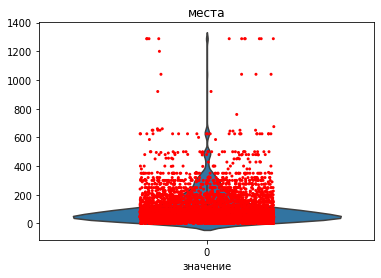

In [32]:
#составляем список столбцов, которые нас интересуют:
columns = ['rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats']
#составим словарь с русско-язычным названием столбцов, чтобы было удобно
names = {'rating':'рейтинг', 'middle_avg_bill':'средний чек',
         'middle_coffee_cup':'средняя цена чашки кофе', 'seats':'места'
        }
#напишем цикл, составляющий графики, чтоб не вводить каждый раз вручную:
for column in columns:
    sns.violinplot(data=df[column]);
    sns.stripplot(data=df[column], color="red", jitter=0.2, size=3);
    plt.title(names[column])
    plt.xlabel('значение')
    plt.show()

Теперь данные выглядят более правдоподобными. 
Хочу отметить, что "средняя цена чашки кофе" совершенно точно является не нормально-распределенной величиной, и заменять пропуски, например, средним, в данном случае неправильно. Поэтому, как оговорено выше, пока оставляем пропуски такими - какие они уже есть. 

#### Вывод
<a id='conclusion1'></a>

Подведём краткие итоги:
_____
1. Таблица содержит пропущенные значения.
* *данные значения на данном этапе работы не требуют замены, большинство из них нельзя заменить, так как они не поддаются логике, а являются случайными величинами. возможно, в дальнейшем нужно будет заменить пропущенные значения стоимости 1 чашки кофе и среднего чека, в зависимости от категории общепита и района расположения, но это станет понятно далее.* 

2. В таблице были дубликаты, они удалены с сохранением последнего дубликата. 
3. Критических ошибок в данных не обнаружено. 
4. Таблица обогащена 2 новыми столбцами. 
5. В таблице с данными были выбросы, мы исправили это.

## Анализ данных
<a id='analys'></a>

### Анализ категорий мест общественного питания
<a id='catering'></a>

In [33]:
#создадим сводную таблицу, в ней будет содержаться категория заведения и количество таких заведений 
#по наименованию заведений
type_count = df.groupby('category').agg({'name':'count'}).reset_index()
total_food = type_count.name.sum() #посчитаем сумму количества заведений по названию заведений
type_count['part'] = type_count['name']/total_food #добавим столбец с долей заведений от всех заведений

type_count.sort_values('part', ascending=False)

,category,name,part
3,кафе,2377,0.282842
6,ресторан,2042,0.242980
4,кофейня,1413,0.168134
0,"бар,паб",765,0.091028
5,пиццерия,633,0.075321
2,быстрое питание,603,0.071752
7,столовая,315,0.037482
1,булочная,256,0.030462


In [34]:
#построим круговую диаграмму и увидим доли, приходящиеся на определённую категорию заведения
fig1 = go.Figure(go.Pie(values=type_count.name,
                      labels=type_count.category,
                      title='Доля категории, от общего числа мест общественного питания',
                       )
                )

fig1.show()

Большая доля заведений приходится на кафе (28.3%), рестораны (24.3%), кофейни (16.8%). Меншая доля на булочные (3.05%), столовые (3.75%).

In [35]:
fig1 = px.bar(type_count,
              x='category',
              y='name',
              text='name',
              title='Количество объектов общественного питания по типу категории'
            )
fig1.update_layout(xaxis_title='Категория',
                  yaxis_title='Число заведений, шт.',
                  xaxis={'categoryorder':'total descending'})
fig1.show()

Больше всего заведений общественного питания относятся к категории кафе, рестораны и кофейни, а меньше всего заведений типа столовая и булочная. Между ними утвердили свои позиции бары, пабы, пиццерии и фаст-фуд. 

### Количество посадочных мест в заведении в зависимости от категории
<a id='seats'></a>

In [36]:
#выведем доступные Series на экран
df.columns

Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats', 'street', 'is_24/7'],
      dtype='object')

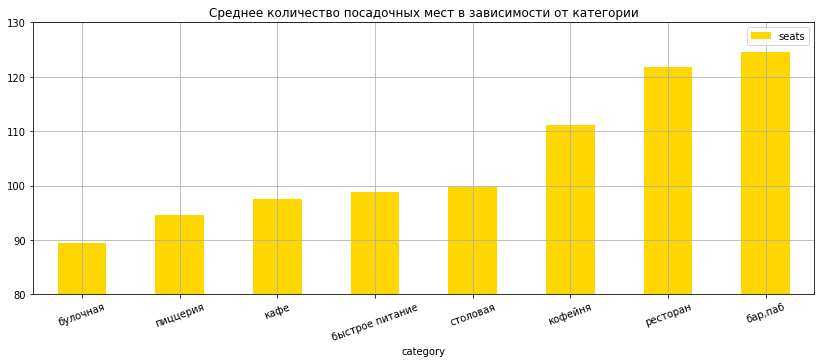

In [37]:
color = ['#ffd700']
df[df['seats'].notna()] \
    .pivot_table(index='category',
                values='seats',
                aggfunc='mean').sort_values(by='seats') \
    .plot(title='Среднее количество посадочных мест в зависимости от категории',
          kind='bar',
          figsize=(14, 5),
          ylim=[80, 130],
          color=color,
          rot = 20,
         grid=True);

В среднем, самое большое количество посадочных мест имеют бары и пабы, рестораны, а так же кофейни. Что логично, так как бары и пабы в принципе предназначены для посиделок больших компаний, например, просмотр футбольных матчей. В ресторанах часто отмечают торжества и проводят, например, корпоративы. Кофейня - это место встречи молодых людей, которые часто используют подобные заведния в качестве места для коворкинга. Наименьшее число посадочных мест мы наблюдаем в булочных, опять же, логично, так как булочная не предназначена для посиделок, в ней покупают пироженные и хлеб и уносят их домой или на работу. Чуть больше мест в пиццериях, но не так много как, например, в кофейнях, так как пиццу как самостоятельный продукт в основном все заказывают домой. Яркий пример "доминос" пицца, "до-до" пицца. В освновном данные заведения работают на доставку, а посадочных мест в них не много. Примерно на одном уровне посадочных мест находятся заведения быстрого питания и кафе, потому что по смыслу, они, в принципе, близки. В них не проводят посиделки и встречи, люди быстро едят и уходят. Чуть больше мест в столовой, это объясняется тем, что столовые строят в близи производств, заводов, офисов, где обеденный перерыв наступает в одно время и люди стремятся быстро поесть и уйти, но для всех - требуется больше места, чем в кафе. 

In [38]:
#сделаем сводную таблицу по категориям
seats = df.pivot_table(values='seats',
                       index='category',
                       aggfunc=['mean', 'count', 'sum', 'median']).round(0).reset_index()
seats.columns = ['category','mean', 'count', 'sum', 'median']
seats = seats.sort_values(by='mean', ascending=False)
seats

,category,mean,count,sum,median
0,"бар,паб",125.0,468,58281.0,82.0
6,ресторан,122.0,1269,154681.0,86.0
4,кофейня,111.0,751,83511.0,80.0
7,столовая,100.0,164,16359.0,76.0
2,быстрое питание,99.0,349,34513.0,65.0
3,кафе,98.0,1218,118770.0,60.0
5,пиццерия,94.0,427,40350.0,55.0
1,булочная,89.0,148,13229.0,50.0


Собственно, медиана подтверждает то же, что мы получили и для среднего значения посадочных мест. 

### Соотношение сетевых и несетевых заведений
<a id='chain'></a>

In [39]:
#узнаем общее количество сетевых/несетевых заведений
# 0 - заведение несетевое
# 1 - заведение сетевое
chain = df['chain'].value_counts().reset_index()

chain.columns=['chain', 'count']
chain

,chain,count
0,0,5199
1,1,3205


Сетевых заведений меньше, чем несетевых.

In [40]:
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=chain['count'])],
                layout=go.Layout(title=go.layout.Title(text='Доли сетевых и несетевых заведений')))
fig.show()

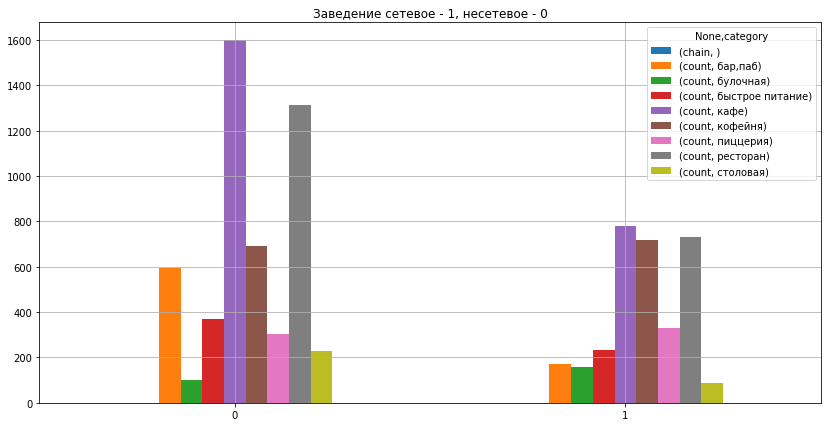

In [41]:
#построим общую гистограмму распределения сетевых и несетевых заведений в зависимости от категории
chain = df.pivot_table(index='chain', 
                       values='name',
                       columns='category',
                       aggfunc=['count']).reset_index().plot(title='Заведение сетевое - 1, несетевое - 0',
                                                                                kind='bar',
                                                                                rot=0,
                                                                                grid=True,
                                                                                figsize=(14,7)
                                                                                )


In [42]:
#сгруппируем категории по сетевым/несетевым и узнаем их количество
chain_group = df.groupby(['category', 'chain'])['name'].count().reset_index()
chain_group.columns = ['category', 'chain', 'count']
chain_group.sort_values(['chain', 'count'])

,category,chain,count
2,булочная,0,99
14,столовая,0,227
10,пиццерия,0,303
4,быстрое питание,0,371
0,"бар,паб",0,596
8,кофейня,0,693
12,ресторан,0,1312
6,кафе,0,1598
15,столовая,1,88
3,булочная,1,157


In [43]:
fig = px.bar(chain_group,
             x='count',
             y='category', 
             title='Количество сетевых и несетевых заведений по категории',
             color='chain',
             )
fig.update_layout(xaxis_title='Количество заведений: несетевые | сетевые',
                  yaxis_title='Категория места общественного питания',
                  yaxis={'categoryorder':'total ascending'} #отобразим значения по нисходящей
                 )
fig.show()

* Известно, что для малых сетей мест общественного питания могут быть ошибки в столбце `chain`, так как особо поделать мы с этим ничего не можем, примем это как факт.
* **Несетевые заведения:**
* Среди них больше всего заведений категории *кафе и рестораны*, а меньше всего *булочных и столовых*.
* **Сетевые заведения:**
* Среди них больше всего заведений категорий *кафе, ресторан и кофейня*, и почти нет *столовых*. 


### Какие заведения чаще всего бывают сетевыми
<a id='chain2'></a>

Для ответа на вопрос построим сводную таблицу, в которой рассчитаем процентные соотношения сетевых категорий и потом построим удобный для восприятия график. Для этого посчитаем общее количество заведений по категории и одновременно по параметру: сетевое/несетевое. Для этого будем использовать метод `merge`, который аналогичен методу `JOIN` в SQL. Это мы сделаем для того, чтобы получилась одна единственная таблица, а не несколько. По сути - создадим сводную из нескольких таблиц. 

In [44]:
cat_chain = df.groupby(['category', 'chain'])['name'].count().reset_index().rename(columns={'name':'count'}).merge(df.groupby(['category'])['chain'].count(), on='category')
cat_chain.columns=['category', 'chain', 'count', 'chain_count']
cat_chain['cat_percent'] = ((cat_chain['count']/cat_chain['chain_count']) * 100).round(1)
cat_chain

,category,chain,count,chain_count,cat_percent
0,"бар,паб",0,596,765,77.9
1,"бар,паб",1,169,765,22.1
2,булочная,0,99,256,38.7
3,булочная,1,157,256,61.3
4,быстрое питание,0,371,603,61.5
5,быстрое питание,1,232,603,38.5
6,кафе,0,1598,2377,67.2
7,кафе,1,779,2377,32.8
8,кофейня,0,693,1413,49.0
9,кофейня,1,720,1413,51.0


In [45]:
#оставим только таблицу по сетевым заведениям
chain_query = cat_chain[cat_chain['chain'] == 1]
chain_query.sort_values(by='cat_percent')

,category,chain,count,chain_count,cat_percent
1,"бар,паб",1,169,765,22.1
15,столовая,1,88,315,27.9
7,кафе,1,779,2377,32.8
13,ресторан,1,730,2042,35.7
5,быстрое питание,1,232,603,38.5
9,кофейня,1,720,1413,51.0
11,пиццерия,1,330,633,52.1
3,булочная,1,157,256,61.3


In [46]:
fig = px.bar(chain_query, x='cat_percent', y='category', color='cat_percent')
fig.update_xaxes(title='Процент сетевых заведений, %')
fig.update_yaxes(title='Категория общественного заведения')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Наиболее частыми сетевыми заведениями оказались - булочные. Чуть реже, но тоже в лидерах оказались пиццерии и кофейни. Реже всего сетевыми являются бары и пабы, по всей видимости это связано с тем, что их чаще открывают отдельные ИП, редко - пивоварни. Так же, редкими сетевыми заведениями являются столовые.

### Топ-15 популярных сетей общественного питания в г. Москва
<a id='top-15'></a>

Под популярностью понимается количество заведений этой сети в регионе г. Москва.

In [47]:
df.columns

Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats', 'street', 'is_24/7'],
      dtype='object')

In [48]:
chain = df[df['chain'] == 1] #оставляем данные только по сетевым заведениям
#группируем по имени, агрегируем по количеству заведений в одном регионе г. Москва, выведем категорию
chain_top = chain.groupby('name').agg({'district' : 'count', 
                                       'category': pd.Series.mode,
                                       'middle_avg_bill':'median',
                                       'price':pd.Series.mode})
chain_top = chain_top.rename(columns={'district':'count', 'middle_avg_bill':'median_bill'})#переименовали "район" на "подсчёт"
#сортируем топ-15 по количеству заведений по региону г. Москва
chain_top = chain_top.sort_values('count', ascending = False).reset_index().head(15)
chain_top

,name,count,category,median_bill,price
0,шоколадница,120,кофейня,650.0,неизвестно
1,домино'с пицца,76,пиццерия,500.0,средние
2,додо пицца,74,пиццерия,391.5,неизвестно
3,one price coffee,71,кофейня,NaN,неизвестно
4,яндекс лавка,69,ресторан,NaN,неизвестно
5,cofix,65,кофейня,NaN,неизвестно
6,prime,50,ресторан,300.0,неизвестно
7,хинкальная,44,кафе,1000.0,неизвестно
8,кофепорт,42,кофейня,NaN,неизвестно
9,кулинарная лавка братьев караваевых,39,кафе,450.0,средние


In [49]:
fig = px.bar(chain_top, x='name', y='count', text='category')
fig.update_xaxes(title='Названия топ-15 сетевых заведений общественного питания')
fig.update_yaxes(title='Количество заведений в г. Москва, шт.')
fig.show()

Самым популярным сетевым заведением оказалась "шоколадница", замкнула топ-15 "му-му". В самые популярные сетевые заведения входят кофейни, пиццери, рестораны, кафе и одна булочная. Столовых или фаст-фуда в топ-15, как ни странно, нет. 

In [50]:
fig = px.bar(chain_top, x='name', y='count', color='category', text='count')
fig.update_xaxes(title='Названия топ-15 сетевых заведений общественного питания')
fig.update_yaxes(title='Количество заведений в г. Москва, шт.')
fig.show()

Среди кофейн самой популярной оказалась шоколадница, среди пицц - домино'с пицца, среди ресторанов яндекс лавка, среди кафе - хинкальная, а булочная только одна - буханка. 

In [51]:
chain_top.describe().T

,count,mean,std,min,25%,50%,75%,max
count,15.0,54.400000,24.784212,27.0,37.50,44.0,70.00,120.0
median_bill,11.0,474.227273,207.762649,237.5,358.25,450.0,506.25,1000.0


* Судя по-всему, в топ-15 сетевых заведений находятся места общественного питания со средним чеком, не превышающем 500-700 рублей на человека.
* В целом, только шоколадница отличается большим количеством залов, когда как остальные сетевые заведения, в среднем, имеют не более 50 залов по Москве. 

### Распределение заведений общественного питания по районам г. Москва
<a id='district'></a>

Посмотрим, какие районно-административные округи Москвы задействованы в датасете:

In [52]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

* 9 районно-административных округов: САО, СВАО, СЗАО, ЗАО, ЦАО, ВАО, ЮВАО, ЮАО, ЮЗАО.
* Посмотрим, в каких районах и в каком колличестве распределены заведения общественного питания.

In [53]:
#для каждого округа посчитаем общее количество заведений общественного питания
cafe_df = df.groupby(['district'], as_index=False).agg({'category':'count'})
cafe_df.sort_values('category', ascending=False)

,district,category
5,Центральный административный округ,2242
2,Северный административный округ,898
8,Южный административный округ,892
3,Северо-Восточный административный округ,891
1,Западный административный округ,851
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


In [54]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cafe_df,
    columns=['district', 'category'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество заведений по округу г. Москва',
).add_to(m)

# выводим карту
m

In [55]:
#создадим переменную для отображения на графике количества и категорий заведения в зависимости от района
district = df.groupby(['district', 'category']).agg({'name' : 'count'}).reset_index()
district = district.rename(columns={'name':'count'})
district.sort_values('count', ascending=False).sample(8)

,district,category,count
60,Юго-Западный административный округ,кофейня,96
64,Южный административный округ,"бар,паб",68
5,Восточный административный округ,пиццерия,72
51,Юго-Восточный административный округ,кафе,282
47,Центральный административный округ,столовая,66
69,Южный административный округ,пиццерия,73
27,Северо-Восточный административный округ,кафе,269
48,Юго-Восточный административный округ,"бар,паб",38


In [56]:
fig = px.bar(district, 
             x='count', 
             y='district',                 
             color='category'
            )

fig.update_layout(title='Распределение заведений по категориям в каждом районе Москвы',
                   xaxis_title='Количество заведений, шт.',
                   yaxis_title='Район Москвы',
                   yaxis={'categoryorder':'total ascending'} #отобразим значения по нисходящей
                 )
fig.show()

Из графика и хороплёта ясно, что наибольшее число заведений общественного питания сконцентировано в ЦАО. В данном районе больше всего открыто заведений категории ресторан, после кафе и кофейни, после них пабы и бары, и далее всё остальное. Меньше всего различных заведений общественного питания открыто в СЗАО, самыми распространёнными категориями там являются кафе и рестораны. Остальные районы Москвы, в среднем, имеют приблизительно равное количество мест общественного питания и чаще всего там, так же, встречаются кафе и рестораны.

### Распределение средних рейтингов по категориям заведений
<a id='rating'></a>

Создадим таблицу, в которую войдут категории заведений общественного питания и посчитаем средний рейтинг для каждой имеющейся категории. На основе этого построим график. 

In [57]:
rating = df.groupby('category').agg({'rating':'mean'}).round(1).sort_values(by='rating', ascending=False).reset_index()

rating

,category,rating
0,"бар,паб",4.4
1,булочная,4.3
2,кофейня,4.3
3,пиццерия,4.3
4,ресторан,4.3
5,столовая,4.2
6,быстрое питание,4.1
7,кафе,4.1


In [58]:
fig = px.bar(rating, x='rating', y='category', text='rating', color='category')

fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Средний рейтинг, от 0 до 5',
                   yaxis_title='Категория заведения общественного питания')
fig.update_xaxes(range=[4, 4.5])
fig.show()


Из графика мы видим, что самый высокий средний рейтинг (4.4) характерен для заведений категории бар/паб. Самые низкие рейтинги в среднем имеют заведения быстрого питания и кафе (4.1). Булочные, кофейни, пиццерии и рестораны в среднем имеют рейтинг (4.3), столовые (4.2). 

### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района Москвы
<a id='horoplet'></a>

In [59]:
#Для каждого округа посчитаем средний рейтинг общепитов, которые находятся на его территории:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').round(1).sort_values(by='rating', ascending=False)
rating_df

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.2
1,Западный административный округ,4.2
2,Северный административный округ,4.2
4,Северо-Западный административный округ,4.2
7,Юго-Западный административный округ,4.2
8,Южный административный округ,4.2
3,Северо-Восточный административный округ,4.1
6,Юго-Восточный административный округ,4.1


In [60]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам Москвы',
).add_to(m)

# выводим карту
m

В среднем, самые высокие рейтинги ставят заведениям, находящимся в ЦАО, а самые низкие рейтинги получают заведения из СВАО и ЮВАО.

### Все заведения датасета, карта c кластерами
<a id='map'></a>

In [61]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

### Топ-15 улиц по количеству заведений
<a id='adress-15'></a>

In [62]:
#выведем топ-15 улиц, это будет таблица для дальнейшей сортировки данных
streets_15 = df[df['street'].notnull()]
streets_15 = streets_15['street'].value_counts().reset_index().head(15)
streets_15.columns = ['street_name', 'count']
streets_15

,street_name,count
0,проспект мира,184
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


In [63]:
#создадим таблицу с названиями улиц и категорий
streets = df.groupby(['street', 'category'])['name'].count().reset_index()
streets.columns = ['street_name', 'category', 'count']
streets.sort_values('count', ascending=False)
#оставим первые 15 улиц по количеству заведений на основе таблицы с топ-15 улиц
top_streets = streets[streets['street_name'].isin(streets_15['street_name'])]
top_streets

,street_name,category,count
698,варшавское шоссе,"бар,паб",6
699,варшавское шоссе,быстрое питание,7
700,варшавское шоссе,кафе,18
701,варшавское шоссе,кофейня,14
702,варшавское шоссе,пиццерия,4
...,...,...,...
3174,улица миклухо-маклая,быстрое питание,4
3175,улица миклухо-маклая,кафе,21
3176,улица миклухо-маклая,кофейня,4
3177,улица миклухо-маклая,пиццерия,2


In [64]:
fig = px.bar(top_streets,
             x='count',
             y='street_name',
             color='category'             
            )
fig.update_layout(title='Топ-15 улиц Москвы по количеству заведений по категории',
                  xaxis_title='Количество заведений, шт.',
                  yaxis_title='Название улицы',
                  yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

И так, мы выяснили, если хочется выпить - то лучше ехать на ленинградский проспект, где много баров и пабов. А вот на МКАДе выпить сложно (все за рулём и пабов там маловато). А если хочется покушать с шиком-блеском в ресторане, то добро пожаловать на проспект мира. А если хочется посетить столовую, то большее число подобных мест сосредоточено на варшавском шоссе. Я предполагаю, что там много дальнобойщиков? Собственно, в целом, мы видим вполне логичную закономерность, что большее количество заведений общественного питания распоралагается именно на проспектах, так как они очень длинные и там есть, где разгуляться, чтоб открыть заведение. 

### Улицы с одним объектом общепита
<a id='one_only'></a>

Посмотрим улицы по районам, на которых располагается только 1 объект общественного питания. 

In [65]:
df.columns #я забываю, какие колонки есть, поэтому вывожу их, чтобы быстро сориентироваться

Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats', 'street', 'is_24/7'],
      dtype='object')

In [66]:
only_one = df.groupby('street').agg({'name':'count', 'district':'max'}).reset_index().sort_values(by='name')
only_one = only_one[(only_one['name']==1) & (only_one['district'].isna()==False)]
only_one.columns = ['street_name', 'count', 'district_name']
only_one

,street_name,count,district_name
0,1-й автозаводский проезд,1,Южный административный округ
681,новосущёвская улица,1,Северо-Восточный административный округ
687,новощукинская улица,1,Северо-Западный административный округ
689,новоясеневский тупик,1,Юго-Западный административный округ
694,одинцовская улица,1,Северо-Западный административный округ
...,...,...,...
5,1-й голутвинский переулок,1,Центральный административный округ
302,валдайский проезд,1,Северный административный округ
6,1-й грайвороновский проезд,1,Юго-Восточный административный округ
190,балакиревский переулок,1,Центральный административный округ


In [67]:
#fig = px.bar(only_one,
            # x='count',
            ## y='street_name',
            # color='district_name'             
            # )
#fig.update_layout(title='Административные округа с одним заведением питания на одной улице',
 #                 xaxis_title='1 заведение на улице',
 #                 yaxis_title='Название улицы',
 #                 yaxis={'categoryorder':'total ascending'}
  #                )
#fig.show()

In [68]:
only_one['district_name'].value_counts()

Центральный административный округ         145
Северо-Восточный административный округ     55
Восточный административный округ            52
Северный административный округ             51
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district_name, dtype: int64

Всего улиц с одним заведением общественного питания 457. Такие улицы есть в каждом районе представленного датасета. Больше всего улиц всего с 1 заведением (145) представлено в ЦАО. Веротяно, это какие-то местечковые переулки, куда мало заходят туристы, но там живут люди. ЦАО очень запутанный, плутающий район с большим количеством переулков, проулков, арок - куда приезжий никогда не зайдет. Меньше всего улиц с 1 кафе находится в ЮЗАО и СЗАО, данные районы отличаются масштабностью улиц, они там огромные, особенно на Юго-Западной. Одна улица может быть просто огромной, поэтому, там более высокая веротяность того, что там откроют больше кафе (эти районы, в основном, состоят из проспектов, а как мы узнали ранее - именно на проспектах открывают много заведений питания). В остальных районах количество одиноких заведений примерно одинаково. Видимо, улицы там примерно одной длины. Было бы интересно узнать среднюю протяженность улицы в каждом из представленных районов. 

### Медианная стоимость заказов в различных заведениях в рублях
<a id='median'></a>

Посчитаем медиану столбца `middle_avg_bill` для каждого района Москвы.

In [69]:
median = df.groupby(['district'])['middle_avg_bill'].median().reset_index()
median.sort_values('middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [70]:
# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам Москвы',
).add_to(m2)

# выводим карту
m2

Из хороплета видно, что средний чек в Москве зависит не от того, насколько далеко заведение располагается от ЦАО, а от того, в каком районе Москвы оно расположено. Связано это с экологией и популярностью направления, и складывающейся от этого стоимостью жилья. Например, самое дорогое жилье располагается в районе рублёвки и рядом с г. Звенигород (ЗАО), где считается самая нормальная экология, и как видим - там и самые высокие средние чеки. Напротив, район котельников, где различные пром зоны и мусоросжигательный завод, чеки ниже остальной Москвы, как и цены на жилье. Ну, а ЦАО, как место притяжения туристов и богатой молодежи - понятно, что там не может быть низкого среднего чека. 

#### Общий вывод
<a id='o'></a>

Формулируем объединённый вывод, на основе промежуточных:
___
1. В данных были ошибки, в целом, данные содержат большое количество пропусков, веротяно, это те пропуски, которые формируются автоматически. Необходимо обратить внимание на это. 
2. Таблица была обогащена.
3.  Для более обширного анализа в датафрейм нужно добавить некоторые данные, например, проходимость места общественного питания, его удалённость от метро, длину улицы, так же нужно добавить время покупки в месте общественного питания.
___
1. Большая доля заведений приходится на кафе (28.3%), рестораны (24.3%), кофейни (16.8%). Меншая доля на булочные (3.05%), столовые (3.75%).
2. Посадочных мест больше всего в ресторанах, барах и пабах - где принятно собираться большой компанией и долго сидеть, отдыхать. Меньше всего в булочной, кафе - там, где либо не приятно сидеть и проводить время, либо ты быстро (чаще в одиночестве) ешь и идёшь по своим делам. 
3. Большая часть мест общественного питания - не сетевые (61.9%), сетевыми являются лишь 38.1% заведений. При этом, чаще всего сетевыми являются булочные и кофейни. Реже всего столовые, бары и пабы.
4. Самым распространённым сетевым заведением оказалась "шоколадница", замкнула топ-15 "му-му". В самые распространённые сетевые заведения входят кофейни, пиццери, рестораны, кафе и одна булочная. Столовых или фаст-фуда в топ-15, как ни странно, нет. При этом, средний чек в популярных заведения не превышает 700 рублей. 
5. Наибольшее число заведений общественного питания сконцентировано в ЦАО. В данном районе больше всего открыто заведений категории ресторан, после кафе и кофейни, после них пабы и бары, и далее всё остальное. Меньше всего различных заведений общественного питания открыто в СЗАО, самыми распространёнными категориями там являются кафе и рестораны. Остальные районы Москвы, в среднем, имеют приблизительно равное количество мест общественного питания и чаще всего там, так же, встречаются кафе и рестораны.
6. Самый высокий средний рейтинг (4.4) характерен для заведений категории бар/паб. Самые низкие рейтинги в среднем имеют заведения быстрого питания и кафе (4.1). Булочные, кофейни, пиццерии и рестораны в среднем имеют рейтинг (4.3), столовые (4.2).
7. Проспект мира - улица, имеющая самое большое число заведений общественного питания. В целом, чем длиннее улица (проспект) - тем больше мест общественного питания открыто. Чем она короче - тем меньше. 
8. Больше всего улиц всего с 1 заведением общественного питания находится в ЦАО, что, скорее всего связанно с особенностями градостроения и тем, что это страя часть города, с очень маленькими улочками, куда многие туристы не попадают. 
9. Западный и Центральный административные округа имеют самый высокой медианный чек по заведениям общественного питания. ЦАО - это центр, старейшая и самая популярная часть города как у туристов, так и у Москвичей. ЗАО - находится в экологически чистом районе и окружена шоссе с самыми дорогими домами, в том числе рядом рублевское шоссе, г. Звенигород и деревня "Грязи" и прочие места, где живёт публика с доходом в миллионы рублей в месяц.

##  Детализируем исследование: открытие кофейни
<a id='detail'></a>

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
<a id='cofe'></a>

In [71]:
#создадим сводную таблицу, в ней будет содержаться категория заведения и количество таких заведений 
#по наименованию заведений
cofe_count = df.groupby(['category', 'district']).agg({'name':'count'}).reset_index()
total_cofe = cofe_count.name.sum() #посчитаем сумму количества заведений по названию заведений
cofe_count['part'] = (cofe_count['name']/total_cofe).round(2) #добавим столбец с долей заведений от всех заведений
cofe_count.columns = ['category', 'district', 'count', 'part'] #переименую столбцы
cofe_count = cofe_count[cofe_count['category'] == 'кофейня'] #оставлю только категорию "кофейня"
display(cofe_count.sort_values('part', ascending=False))
print()
print("Общее количество кофеен в Москве:", cofe_count['count'].sum())

,category,district,count,part
41,кофейня,Центральный административный округ,428,0.05
37,кофейня,Западный административный округ,150,0.02
38,кофейня,Северный административный округ,193,0.02
39,кофейня,Северо-Восточный административный округ,159,0.02
44,кофейня,Южный административный округ,131,0.02
36,кофейня,Восточный административный округ,105,0.01
40,кофейня,Северо-Западный административный округ,62,0.01
42,кофейня,Юго-Восточный административный округ,89,0.01
43,кофейня,Юго-Западный административный округ,96,0.01



Общее количество кофеен в Москве: 1413


Столбец "доля" (`part`) отражает, какую чать от всех категорий заведений в заданном административном округе составляют *кофейни*.

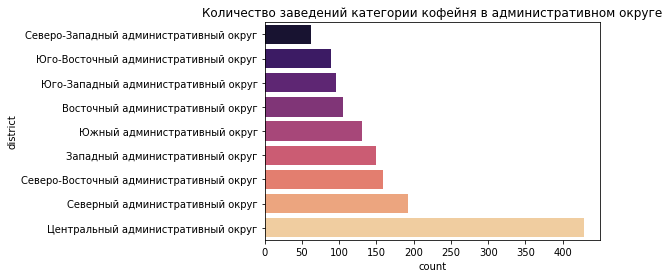

In [72]:
sns.barplot(data=cofe_count,
            x="count", 
            y="district",
            order=cofe_count.sort_values('count').district,
            palette="magma"
           )
plt.title("Количество заведений категории кофейня в административном округе", fontsize = 12);

In [73]:
#построим круговую диаграмму и увидим доли, приходящиеся на определённую категорию заведения
fig3 = go.Figure(go.Pie(values=cofe_count.part,
                      labels=cofe_count.district,
                      title='Доля кофеен от всех категорий заведений в округе',
                       )
                )

fig3.show()

Если рассматривать каждый административный округ Москвы, то самая большая доля кофеен от всех остальных заведений находится в ЦАО (почти 30% заведений в данном округе - кофейни). Меньшая доля среди заведений на кофейни приходится в ВАО, СЗАО, ЮВАО и ЮЗАО. 

In [74]:
# создаём карту Москвы
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cofe_count,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_opacity=0.8,
    legend_name='Количество заведений категории кофейня по округам Москвы',
).add_to(m3)

# выводим карту
m3

Из хороплёта мы видим, что больше всего кофейн (количественно, от общего числа всех кофейн Москвы), открыто в ЦАО, а меньше всего в СЗАО, ЮВАО, ЮЗАО и ВАО. 

In [75]:
df_cofe = df[df['category'] == 'кофейня']

In [76]:
# создаём карту Москвы
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m4)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_cofe.apply(create_clusters, axis=1)

# выводим карту
m4

Судя по карте, предприниматели стараются открывать кофейни вдоль крупных магистралей (если это не ЦАО), около метро и МЦД, много кофеен в районах госпиталей, больниц, университетов и колледжей. Например, вдоль каширского шоссе очень много кофеен, там же находится онкологический центр им. Блохина и другие медицинские государственные центры. В ЦАО - вдоль известных туристических улиц, рядом с метро, около туристичеких объектов. 
* При поиске места для открытия кофейни, я бы посоветовала внимательно изучить количество кофеен рядом с медицинскими центрами, которые посещают люди со всей территории РФ, а так же около вокзалов, колледжей и университетов. 

### Круглосуточные кофейни
<a id='open_cofe'></a>

In [77]:
cofe_open = df[(df['category'] == 'кофейня') & (df['is_24/7'] == 'TRUE')]
print("Всего круглосуточных кофейн в Москве:", cofe_open.shape[0])

Всего круглосуточных кофейн в Москве: 59


In [78]:
# создаём карту Москвы
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m5)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cofe_open.apply(create_clusters, axis=1)

# выводим карту
m5

In [79]:
cofe_open['name'].value_counts()

шоколадница           17
кофемания              8
wild bean cafe         6
wild bean              5
кофе хауз              3
you&coffee             2
кофе с собой           2
cofix                  2
столица                1
лаванда кофе           1
пирог хауз             1
гоголь-моголь          1
one more, please       1
cinnabon               1
one&double             1
кофейня one&double     1
one price coffee       1
foodmoscowcoffee       1
кофе on                1
молоко                 1
the wild bean cafe     1
one and double         1
Name: name, dtype: int64

In [80]:
part_cofe_open = (59/1413)*100
print('Доля круглосуточных коффен к обычным:', part_cofe_open)

Доля круглосуточных коффен к обычным: 4.175513092710545


Всего в Москве 59 кофеен, которые работают круглосуточно, что составляет 4,2% от общего числа кофеен датасета. Исходя из карты, в целом, их можно найти по всей Москве, но основная часть в центре, на юге и вдоль МКАДа. В основном, круглосуточные кофейни представлены сетью "шоколадница", "кофемания", "wild bean cafe", "кофе хауз". Остальные - это единичные кофейни, которые имеют максимум 2 точки. 

### Рейтинг кофеен в зависимости от административного центра
<a id='rating_cofe'></a>

In [81]:
cofe_rating = df_cofe.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
cofe_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [82]:
# создаём карту Москвы
m6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cofe_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    legend_name='Средний рейтинг заведений по районам',
).add_to(m6)

# выводим карту
m6

Чем темнее цвет административного округа на хороплёте, тем выше рейтинги кофеен в данном округе. Самые высокие рейтинги получают кофейни, расположенные в ЦАО, а так же в СЗАО, а самые низкие - СВАО и ЗАО.

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
<a id='cofe_price'></a>

In [83]:
cofe_price = df_cofe.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(0).sort_values('middle_coffee_cup', ascending=False)
display(cofe_price)
print(' ')
print('Средняя стоимость чашки капучино в Москве:', cofe_price['middle_coffee_cup'].mean().round(0))
print('Медианная стоимость чашки капучино в Москве:', cofe_price['middle_coffee_cup'].median().round(0))

,district,middle_coffee_cup
1,Западный административный округ,190.0
5,Центральный административный округ,188.0
7,Юго-Западный административный округ,184.0
2,Северный административный округ,166.0
4,Северо-Западный административный округ,166.0
3,Северо-Восточный административный округ,165.0
8,Южный административный округ,158.0
6,Юго-Восточный административный округ,151.0
0,Восточный административный округ,140.0


 
Средняя стоимость чашки капучино в Москве: 168.0
Медианная стоимость чашки капучино в Москве: 166.0


    На основе полученных значений построим хороплёт

In [84]:
# создаём карту Москвы
m7 = Map(location=[moscow_lat, moscow_lng], zoom_start=9.5)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cofe_price,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    legend_name='Средняя стоимости чашки капучино по округу',
).add_to(m7)

# выводим карту
m7

Мы видим, что в зависимости от административного округа Москвы, стоимость капучино разнится. Самые высокие цены на чашку капучино пресдатвлены в ЦАО, вблизи аэропортов, а так же, в районах, которые считаются экологически чистыми (в Москве), самые дешевые цены на кофе представлены на востоке столицы, где и самое дешёвое жильё и где экология считается плохой.

Средняя стоимость чашки капучино в Москве составляет 168 рублей, медианная на 2 рубля ниже - 166 рублей. 

In [85]:
df_cofe.columns

Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats', 'street', 'is_24/7'],
      dtype='object')

In [86]:
#посмотрим медианное значение посадочных мест в кофейнях по округам
seat = df_cofe.groupby('district')['seats'].agg('median')
seat.sort_values(ascending=False)

district
Западный административный округ            96.0
Северо-Западный административный округ     87.5
Центральный административный округ         86.0
Южный административный округ               80.0
Северо-Восточный административный округ    75.0
Северный административный округ            66.0
Юго-Западный административный округ        64.5
Восточный административный округ           55.0
Юго-Восточный административный округ       50.0
Name: seats, dtype: float64

Как видим,  райзные округа Москвы достаточно сильно отличаются количеством посадочных мест в кофейнях, практически в 2 раза между ЗАО и ЮВАО, например. 

При открытии кофейни, необходимо будет ориентироваться на среднюю цену чашки кофе в выбранном районе. Например, если кофейня будет открыта в ВАО, а цена будет назначена на 170 рублей, то она будет завышена по отношению к остальным кофейням района. При этом, если она будет открыта в ЦАО, где-нибудь на Патриарших прудах, а цена будет как в ВАО, в 140 рублей, публика может не понять такой низкой стоимости. 

За среднюю стартовую цену можно принять чашку капучино, которая будет стоить в районе 160 рублей - она не самая низкая и не самая высокая, приведена как ориентир для старта, далее можно будет ориентироваться, в зависимости от проходимости открытой точки. 

При открытии кофейни в ЦАО И СЗАО нужно помнить о том, что покупатели будут ждать высокого уровня обслуживания и сервиса, так как остальные кофейни в этих районах имеют более высокий рейтинг, чем в остальных районах. 

Возможно, стоит обратить своё внимание на открытие кофейни именно круглосуточного типа, так как их на данный момент достаточно мало. Нужно учитывать проходимость места в ночное время, большая плотность населения в ночное время встречается либо в центре (ЦАО) - как место проведения досуга, туристическое место, либо вдоль крупных магистралей с дальнобойщиками и фурами, которые пускают в Москву только после полуночи (МКАД, Каширское шоссе и подобные). Так же, можно сделать круглосуточную кофейню по шоссе, которые ведут в сторону и из аэропортов. 

Веротяно, в дальнейшем стоит рассматривать именно сетевой характер кофеен. Часть из них можно будет сделать круглосточными, часть нет. 

Если не хочется рассматривать круглосуточную кофейню, то неплохим вариантом станет кофейня вблизи мест с большим скоплением людей, которым нужно где-то провести своё время. Например, в районах областных медицинских центров, в районе университетов и колледжей. С учётом этого, стоимость чашки кофе не должна привышать 160 рублей, так как потенциальные покупатели в этих местах - не будут относиться к высокообеспеченным людям. 

**Общая рекоммендация:**
круглосуточная кофейня в центре или на МКАДе, со стартовой ценой на чашку капучино в районе 160 рублей, вблизи учебного, медицинского заведения или бизнес центра, с небольшим количеством посадочных мест (с учётом низкой посещаемости в ночное время), до 50 посадочных мест. 

#### Презентация в облачном хранилище:
<a id='presentation'></a>

Презентация: <https://disk.yandex.ru/i/WsyPcDDibss34Q> 